In [1]:
%load_ext autoreload
%autoreload 2

# import intake
import numpy as np
import netCDF4 as nc
import xarray as xr
import os
from matplotlib import pyplot as plt
#import xesmf as xe
import pandas as pd
import pickle
import cartopy.crs as ccrs
import cartopy.feature as cfeature
# import matplotlib.ticker as mticker
# from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
#from gfdl_grid_paper import *
import momlevel
import glob
#import cf_xarray as cfxr
from scipy.interpolate import griddata

In [2]:
inputdir='/glade/work/clittle/p2521/input/'
inputdir2='/glade/work/clittle/p2521/'
modeldir='model/'
# ds_grid = xr.open_dataset(inputdir+modeldir+'ESM4_ocean_static.nc')
# ds_grid_esm4=ds_grid[['geolon','geolat','geolon_c','geolat_c','wet','areacello', 'deptho']]

In [3]:
tgcsvin = './tg_locs_gs.csv'
# temp

In [4]:
margin = 2

def cutdomain(ds, margin):
    # Common variations of latitude and longitude names
    latitude_names = ['lat', 'latitude', 'Latitude', 'LAT', 'nav_lat']
    longitude_names = ['lon', 'longitude', 'Longitude', 'LON', 'nav_lon']

    #latitude_names = ds.cf.coordinates['latitude'][0]
    #longitude_names = ds.cf.coordinates['longitude'][0]

    # Identify the latitude and longitude coordinate names in the dataset
    lat_name = next((name for name in latitude_names if name in ds.coords), None)
    lon_name = next((name for name in longitude_names if name in ds.coords), None)

    if lat_name is None or lon_name is None:
        raise ValueError("Latitude or longitude coordinate not found in the dataset.")
   
    # Ensure that latitude and longitude arrays are computed before using them for indexing
    ds[lat_name] = ds[lat_name].compute()
    ds[lon_name] = ds[lon_name].compute()

    # Apply the margin-based conditions using the detected latitude and longitude names
    ds = ds.where(ds[lat_name] < max_lat + margin, drop=True)
    ds = ds.where(ds[lat_name] > min_lat - margin, drop=True)
    ds = ds.where(ds[lon_name] < max_lon + margin, drop=True)
    ds = ds.where(ds[lon_name] > min_lon - margin, drop=True)

    return ds

In [5]:
def model_dim_check(ds):
    if 'j' not in list(ds.dims):
        ds = ds.rename({'y':'j', 'x':'i','lat':'latitude', 'lon':'longitude'})#.drop(#['lon']#=ds_grid.geolon.values
        
    if 'lat_bnds' in list(ds.keys()):
        ds = ds.rename({'lat_bnds':'vertices_latitude', 'lon_bnds':'vertices_longitude', 'vertex':'vertices'})#.drop(#['lon']#=ds_grid.geolon.values

    if 'bounds_lat' in list(ds.keys()):
        ds = ds.rename({'bounds_lat':'vertices_latitude', 'bounds_lon':'vertices_longitude', 'nvertex':'vertices'})#.drop(#['lon']#=ds_grid.geolon.values
        
    # Common variations of latitude and longitude names
    latitude_names = ['lat', 'latitude', 'Latitude', 'LAT', 'nav_lat']
    longitude_names = ['lon', 'longitude', 'Longitude', 'LON', 'nav_lon']

    #latitude_names = ds.cf.coordinates['latitude'][0]
    #longitude_names = ds.cf.coordinates['longitude'][0]

    # Identify the latitude and longitude coordinate names in the dataset
    lat_name = next((name for name in latitude_names if name in ds.coords), None)
    lon_name = next((name for name in longitude_names if name in ds.coords), None)
    
    if ds.sizes['i'] > ds.sizes['j']:
        print('i dimension is larger than j dimension. Therefore, dimension names need to be swapped')
        ds = ds.rename({'i':'i_temp', 'j':'j_temp'})
        ds = ds.rename({'i_temp':'j', 'j_temp':'i'})
        print('dimension names swapped')

    else:
        #ds.sizes['i'] < ds.sizes['j']
        print('no swapping of i and j dimensions')

    if ds[lon_name].min() < 0:
        print('longitude ranges from -180 to 180. This needs to be changed as 0 to 360')
        temp = ds[lon_name]
        temp = (temp+360)%360
        ds = ds.drop_vars('longitude')
        ds = ds.assign_coords(longitude=(['i', 'j'], temp.data))
        print('longitude values changed')

    return(ds)

In [6]:
import numpy as np
import xarray as xr
import cftime

EPOCH = np.datetime64('1970-01-01T00:00:00')

def cftime_to_datetime64ns_da(time_da: xr.DataArray) -> xr.DataArray:
    """Convert CFTime/object datetimes to numpy datetime64[ns] (dask-safe)."""
    units = 'seconds since 1970-01-01 00:00:00'
    cal = (time_da.encoding.get('calendar')
           or time_da.attrs.get('calendar')
           or 'proleptic_gregorian')
    def _block(x):
        secs = cftime.date2num(x.ravel().tolist(), units=units, calendar=cal)
        ns = np.round(np.asarray(secs) * 1e9).astype('int64')
        out = EPOCH + ns.astype('timedelta64[ns]')
        return out.reshape(x.shape)
    return xr.apply_ufunc(_block, time_da, dask='parallelized',
                          output_dtypes=[np.dtype('datetime64[ns]')])

def ensure_time_datetime64ns(ds: xr.Dataset) -> xr.Dataset:
    """Return a copy with time as numpy datetime64[ns]."""
    t = ds['time']
    if np.issubdtype(t.dtype, np.datetime64):
        t_ns = t.astype('datetime64[ns]')
    elif t.dtype == object:
        # object array: could be Python datetime or CFTime; use CFTime path (works for both)
        t_ns = cftime_to_datetime64ns_da(t)
    else:
        raise TypeError(f"Unsupported time dtype: {t.dtype}")
    return ds.assign_coords(time=t_ns)

def ensure_time_bnds_datetime64ns(ds: xr.Dataset) -> xr.Dataset:
    if 'time_bnds' in ds.variables and not np.issubdtype(ds['time_bnds'].dtype, np.datetime64):
        ds = ds.copy()
        ds['time_bnds'] = cftime_to_datetime64ns_da(ds['time_bnds'])
    return ds

In [7]:
%%time
# Define available models
mods = [
    #"DTU22",
    "CNRM-CM6-1",
    "CNRM-CM6-1-HR",
    "EC-Earth3P",
    "EC-Earth3P-HR",
    "GFDL-ESM4",
    "GFDL-CM4",
    "HadGEM3-GC31-LL",
    "HadGEM3-GC31-MM",
    "HadGEM3-GC31-HM",
    #"HadGEM3-GC31-HH",
    "ECMWF-IFS-LR",
    "ECMWF-IFS-MR",
    #"ECMWF-IFS-HR",
     #"CMCC-CM2-HR4",
    # "CMCC-CM2-VHR4",
    # "HadGEM3-GC31-HH"
]
ds_models_zos=[]
source_ids = mods#[4:6]
for i in range(len(source_ids)):
    source_id=source_ids[i]
    if (source_id=="DTU22"):
        ds_zos = xr.open_dataset("/glade/work/clittle/p2521/input/obs/dtuuh22mdt.nc")
    else:
        if (source_id=="GFDL-ESM4") or (source_id=="GFDL-CM4"):
            ds_zos = xr.open_mfdataset(inputdir2+'zos_Omon_'+source_id+'*.nc')
            ds_zos = ds_zos.rename({'y':'j', 'x':'i','lat':'latitude', 'lon':'longitude'})#.drop(#['lon']#=ds_grid.geolon.values
        else:
            filepath = f'/glade/work/netige/Data/CMIP6_Downloader/data/s_{source_id}_e_hist-1950_vl_r1i*_f_mon_v_zos/'
            ds_zos_flist1 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_199*.nc'))
            ds_zos_flist2 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_200*.nc'))#[0-9].nc'))
            ds_zos_flist3 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_201*.nc'))
            #ds_zos_flist4 = sorted(glob.glob(filepath+f'/zos_Omon_{source_id}_hist-1950_r1i*_gn_202*.nc'))
            ds_zos_flist = (ds_zos_flist1+ds_zos_flist2+ds_zos_flist3)
            ds_zos = xr.open_mfdataset(ds_zos_flist)        # print(i)
        
    # #Check if model dimensions are compatible to run cutdomain. If not modify model dimensions
        ds_zos = model_dim_check(ds_zos)
    

    if (source_id=="DTU22"):
        ds_model = ds_zos.rename({'mdt':'zos'}).drop_vars('err_mdt')
    else:
        ds_model = ds_zos.sel(time=slice('1993-01', '2014-12'))

    # ---- Add a COMMON NUMERIC TIME CLOCK (optional but handy) ----
    # This gives you the SAME convention (MJD days) on every dataset

    if np.issubdtype(ds_model['time'].dtype, np.datetime64) is False:
        ds_model = ensure_time_datetime64ns(ds_model)
        ds_model = ensure_time_bnds_datetime64ns(ds_model)
        print(source_ids[i] + "time converted to datetime64")
    ##    ds_model = ds_model.rename({'time': 'time_cf'})
    #    time_mjd = to_mjd_days(ds_model['time_cf'])        # has dim 'time_cf'
    #    ds_model = ds_model.assign_coords(time=time_mjd)   # <-- no tuple; DA is OK here
    ##    ds_model = ds_model.swap_dims({'time_cf': 'time'})
    #    ds_model = ds_model.set_coords('time_cf')
    #    ds_model['time'].attrs.update({
    #        'units': 'days since 1858-11-17 00:00:00',
    #        'long_name': 'Modified Julian Day'
    #    })
    
    # Append to list
    #ds_model_zos.to_netcdf(f"./zos_{source_id}.nc")
        #ds_model=ds_model.mean(dim='year').compute()  
    ds_model = ds_model.chunk({"time": -1})            # single time chunk
    ds_models_zos.append(ds_model)
    print('Done with ' + source_ids[i])
# ds_models



<timed exec>:38: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
Done with CNRM-CM6-1


<timed exec>:38: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
Done with CNRM-CM6-1-HR


<timed exec>:38: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
Done with EC-Earth3P


<timed exec>:38: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
Done with EC-Earth3P-HR


<timed exec>:29: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
GFDL-ESM4time converted to datetime64
Done with GFDL-ESM4


<timed exec>:29: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
GFDL-CM4time converted to datetime64
Done with GFDL-CM4


<timed exec>:38: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
HadGEM3-GC31-LLtime converted to datetime64
Done with HadGEM3-GC31-LL


<timed exec>:38: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
HadGEM3-GC31-MMtime converted to datetime64
Done with HadGEM3-GC31-MM


<timed exec>:38: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


i dimension is larger than j dimension. Therefore, dimension names need to be swapped
dimension names swapped
longitude ranges from -180 to 180. This needs to be changed as 0 to 360
longitude values changed
HadGEM3-GC31-HMtime converted to datetime64
Done with HadGEM3-GC31-HM


<timed exec>:38: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


no swapping of i and j dimensions
Done with ECMWF-IFS-LR


<timed exec>:38: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.


no swapping of i and j dimensions
Done with ECMWF-IFS-MR
CPU times: user 11.8 s, sys: 1.14 s, total: 12.9 s
Wall time: 48.2 s


Below is a dask/xarray-friendly way to compute and remove the seasonal cycle using the HW95 equilibrium-tide phases (sa = annual, ss = semi-annual) as in MATLAB get_EQphase function. 

It:

1. computes the HW95 phases for each time stamp,

2. builds a harmonic design matrix [1, cos(sa), sin(sa), cos(ss), sin(ss)],

3. fits least squares at each grid cell,

4. returns the fitted seasonal signal and the deseasoned anomalies, plus amplitude/phase maps.

In [8]:
# Here the computatiosn are degree based

import numpy as np
import xarray as xr

# ------------------------
# Helpers (DEGREES-based)
# ------------------------
def wrap360(x):
    """Wrap angle(s) in degrees to [0, 360)."""
    return np.mod(x, 360.0)

def get_EQphase_deg_xr(time_da, constituents=("sa", "ss")):
    """
    HW95 phases in **degrees**, wrapped to [0, 360).
    Returns DataArray with dims ('time','constituent') and name 'phase_deg'.
    """
    # datetime64 -> MJD (days since 1858-11-17)
    mjd = (time_da - np.datetime64('1858-11-17T00:00:00')) / np.timedelta64(1, 'D')
    # Reference epoch: J2000.0 (midday)
    T = (mjd - 51544.5) / 36525.0

    # Fundamental arguments (degrees) — HW95 polynomials
    tau = 242.14980453 + 12703732.88855*T + 0.0017696111*T**2 - 0.00000183140*T**3
    s   = 218.31664563 +   481267.881196*T - 0.0014663889*T**2 + 0.00000185140*T**3
    h   = 280.46645016 +    36000.7697488*T + 0.0003032222*T**2 + 0.000000020*T**3
    p   =  83.35324312 +     4069.01363525*T - 0.0103217222*T**2 - 0.00001249168*T**3
    zns = 234.95544499 +     1934.13626197*T - 0.0020756111*T**2 - 0.00000213942*T**3
    ps  = 282.93734098 +        1.719457667*T + 0.0004568889*T**2 - 0.00000001776*T**3

    # Doodson combos for seasonal terms (in DEGREES)
    arg_sa_deg = h            # [0 0 1 0 0 0]·[tau s h p zns ps]^T
    arg_ss_deg = 2.0 * h      # [0 0 2 0 0 0]·[...]

    phases = {}
    if "sa" in constituents:
        phases["sa"] = wrap360(arg_sa_deg).rename("sa")
    if "ss" in constituents:
        phases["ss"] = wrap360(arg_ss_deg).rename("ss")

    ph = xr.concat([phases[c] for c in constituents],
                   dim=xr.DataArray(list(constituents), dims=("constituent",)))
    ph.name = "phase_deg"
    ph = ph.assign_coords(time=time_da)
    return ph  # dims: time, constituent  (values in degrees)

def build_design_from_phases_deg(phase_da):
    """
    Phase input in **degrees**. Builds design matrix with columns:
    ['const', 'sa_cos','sa_sin','ss_cos','ss_sin'] using cos/sin of (deg→rad).
    """
    regs = ["const", "sa_cos", "sa_sin", "ss_cos", "ss_sin"]

    # Drop the scalar 'constituent' coord that .sel leaves behind
    sa_deg = phase_da.sel(constituent="sa").reset_coords(drop=True)  # (time,)
    ss_deg = phase_da.sel(constituent="ss").reset_coords(drop=True)

    # Convert ONLY here to radians for trig
    sa_rad = np.deg2rad(sa_deg)
    ss_rad = np.deg2rad(ss_deg)

    X_list = [
        xr.ones_like(sa_deg),   # const
        xr.ufuncs.cos(sa_rad),  # sa_cos
        xr.ufuncs.sin(sa_rad),  # sa_sin
        xr.ufuncs.cos(ss_rad),  # ss_cos
        xr.ufuncs.sin(ss_rad),  # ss_sin
    ]
    X = xr.concat(X_list, dim=xr.DataArray(regs, dims=("reg",))).reset_coords(drop=True)
    X.name = "design"
    return X  # dims: time, reg

def _fit_lstsq_1d(y, X):
    """
    y: (time,), X: (time,reg)  -> returns beta: (reg,)
    NaN-robust least squares.
    """
    mask = np.isfinite(y)
    if mask.sum() < X.shape[1]:
        return np.full((X.shape[1],), np.nan, dtype=float)
    beta, *_ = np.linalg.lstsq(X[mask, :], y[mask], rcond=None)
    return beta

def fit_harmonics_deg(ds, var="zos"):
    """
    Fit Sa & Ssa using **degree-based phases** from HW95.
    Returns amplitude and **phase in degrees [0,360)**.
    """
    # Lighten memory
    ds_work = ds.drop_vars(["vertices_longitude", "vertices_latitude", "time_bounds"], errors="ignore")

    # Phases in DEGREES + design
    phases_deg = get_EQphase_deg_xr(ds_work["time"], constituents=("sa", "ss"))  # (time,constituent)
    X = build_design_from_phases_deg(phases_deg)                                  # (time,reg)

    # Optional: ensure single time-chunk to avoid core-dim issues
    ds_y = ds_work[var]
    if hasattr(ds_y.data, "chunks"):
        ds_y = ds_y.chunk({"time": -1})
        X    = X.chunk({"time": -1})

    # Fit coefficients
    betas = xr.apply_ufunc(
        _fit_lstsq_1d,
        ds_y,  # (time,i,j)
        X,     # (time,reg)
        input_core_dims=[["time"], ["time", "reg"]],
        output_core_dims=[["reg"]],
        dask="parallelized",
        vectorize=True,
        output_dtypes=[float],
        dask_gufunc_kwargs={"allow_rechunk": True},
    ).assign_coords(reg=X["reg"]).rename("beta")   # (i,j,reg)

    # Predicted seasonal signal
    seasonal = xr.dot(X, betas, dims="reg").rename(f"{var}_seasonal")

    # Anomalies
    anomaly = (ds_work[var] - seasonal).rename(f"{var}_anom")

    # Amplitude & PHASE **IN DEGREES**
    a_sa = betas.sel(reg="sa_cos"); b_sa = betas.sel(reg="sa_sin")
    a_ss = betas.sel(reg="ss_cos"); b_ss = betas.sel(reg="ss_sin")

    A_sa   = np.hypot(a_sa, b_sa).rename("A_sa")
    A_ss   = np.hypot(a_ss, b_ss).rename("A_ss")
    # atan2 returns radians; convert to degrees and wrap to [0,360)
    phi_sa_deg = wrap360(np.degrees(np.arctan2(b_sa, a_sa))).rename("phi_sa_deg")
    phi_ss_deg = wrap360(np.degrees(np.arctan2(b_ss, a_ss))).rename("phi_ss_deg")

    intercept = betas.sel(reg="const").rename("intercept")

    return xr.Dataset(
        {
            "design": X,                       # design (rad used only internally in trig)
            "beta": betas,                     # cos/sin coefficients
            f"{var}_seasonal": seasonal,       # fitted seasonal signal
            f"{var}_anom": anomaly,            # deseasoned anomalies
            "A_sa": A_sa,
            "phi_sa_deg": phi_sa_deg,          # PHASE in degrees [0,360)
            "A_ss": A_ss,
            "phi_ss_deg": phi_ss_deg,          # PHASE in degrees [0,360)
            "intercept": intercept,
        }
    )

# --------------------
# Run on data
# --------------------

#out = fit_harmonics_deg(ds_models_zos[1], var="zos")



In [9]:
# function to plot maps
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_amp_map(ds: xr.Dataset, var="A_sa", *, robust=True, vmin=0, vmax=10.5,
                 cmap="jet", projection="PlateCarree", central_longitude=180,
                title = None):
    """
    Plot seasonal amplitude (A_sa or A_ss) on a map using cartopy.

    Parameters
    ----------
    ds : xr.Dataset
        Your harmonic output dataset (like ha_outputs[0]).
    var : {"A_sa","A_ss"}
        Which amplitude to plot.
    robust : bool
        If True and vmin/vmax not provided, use 2–98th percentiles.
    vmin, vmax : float or None
        Fixed color limits. If None, uses robust percentiles or full min/max.
    cmap : str
        Matplotlib colormap name. "jet" to mimic MATLAB look.
    projection : {"Robinson","PlateCarree"}
        Map projection for display.
    central_longitude : float or None
        Central longitude for the map. If None, auto-choose (180 for 0–360° lon).
    """
    if var not in ds:
        raise KeyError(f"{var} not found. Available: {', '.join([k for k in ds.data_vars if k.startswith('A_')])}")

    da = ds[var]*100

    # --- locate lon/lat coords ---
    lon_name = "longitude" if "longitude" in da.coords else ("lon" if "lon" in da.coords else None)
    lat_name = "latitude"  if "latitude"  in da.coords else ("lat" if "lat" in da.coords else None)
    if lon_name is None or lat_name is None:
        raise KeyError("Could not find 'longitude'/'latitude' or 'lon'/'lat' coordinates on the DataArray.")

    lon = da[lon_name]
    lat = da[lat_name]

    # --- get 2D lon/lat ---
    if lon.ndim == 1 and lat.ndim == 1:
        Lon, Lat = np.meshgrid(lon.values, lat.values)
    else:
        Lon, Lat = lon.values, lat.values

    # --- pick central_longitude & possibly wrap longitudes to avoid seams ---
    # If longitudes look like 0..360, default to map centered at 180.
    if central_longitude is None:
        try:
            # avoid computing entire grid: just peek at a small subset
            lon_sample = np.array([Lon.flat[0], Lon.flat[-1]])
            central_longitude = 180 if np.nanmax(lon_sample) > 180 else 0
        except Exception:
            central_longitude = 0

    # For clean plotting, wrap to [-180, 180] in the display frame:
    Lon_wrap = ((Lon - central_longitude + 180) % 360) - 180 + central_longitude

    # --- choose projection ---
    if projection == "PlateCarree":
        proj = ccrs.PlateCarree(central_longitude=central_longitude)
    else:
        proj = ccrs.Robinson(central_longitude=central_longitude)

    # --- choose color limits ---
    if vmin is None or vmax is None:
        if robust:
            q = da.quantile([0.02, 0.98], skipna=True).compute()
            vmin = float(q.sel(quantile=0.02)) if vmin is None else vmin
            vmax = float(q.sel(quantile=0.98)) if vmax is None else vmax
        else:
            vmin = float(da.min(skipna=True).compute()) if vmin is None else vmin
            vmax = float(da.max(skipna=True).compute()) if vmax is None else vmax

    # --- plot ---
    fig = plt.figure(figsize=(11, 5))
    ax = plt.axes(projection=proj)
    pc = ax.pcolormesh(
        Lon_wrap, Lat, da.values,
        transform=ccrs.PlateCarree(),
        cmap=cmap, vmin=vmin, vmax=vmax, shading="auto"
    )
    ax.coastlines(linewidth=0.6)
    ax.add_feature(cfeature.LAND, facecolor="gray", zorder=1)
    gl = ax.gridlines(draw_labels=False, linewidth=0.3, color="gray", alpha=0.5)

    cb = plt.colorbar(pc, ax=ax, orientation="horizontal", pad=0.05, fraction=0.06)
    cb.set_label(f"cm")

    #ax.set_title(f"{var} map  —  central_lon={central_longitude}°, proj={projection}")
    ax.set_title(title)
    plt.tight_layout()
    plt.show()

# Example:
# plot_amp_map(ha_outputs[0], var="A_sa", robust=True, cmap="jet")
# plot_amp_map(ha_outputs[0], var="A_ss", robust=True, cmap="jet", projection="PlateCarree")


In [10]:
# function to plot maps
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_phase_map(ds: xr.Dataset, var="phi_sa_deg", *, vmin=0, vmax=360,
                 cmap="jet", projection="PlateCarree", central_longitude=180,
                title = None):
    """
    Plot seasonal amplitude (A_sa or A_ss) on a map using cartopy.

    Parameters
    ----------
    ds : xr.Dataset
        Your harmonic output dataset (like ha_outputs[0]).
    var : {"A_sa","A_ss"}
        Which amplitude to plot.
    robust : bool
        If True and vmin/vmax not provided, use 2–98th percentiles.
    vmin, vmax : float or None
        Fixed color limits. If None, uses robust percentiles or full min/max.
    cmap : str
        Matplotlib colormap name. "jet" to mimic MATLAB look.
    projection : {"Robinson","PlateCarree"}
        Map projection for display.
    central_longitude : float or None
        Central longitude for the map. If None, auto-choose (180 for 0–360° lon).
    """
    if var not in ds:
        raise KeyError(f"{var} not found. Available: {', '.join([k for k in ds.data_vars if k.startswith('A_')])}")

    da = ds[var]

    # --- locate lon/lat coords ---
    lon_name = "longitude" if "longitude" in da.coords else ("lon" if "lon" in da.coords else None)
    lat_name = "latitude"  if "latitude"  in da.coords else ("lat" if "lat" in da.coords else None)
    if lon_name is None or lat_name is None:
        raise KeyError("Could not find 'longitude'/'latitude' or 'lon'/'lat' coordinates on the DataArray.")

    lon = da[lon_name]
    lat = da[lat_name]

    # --- get 2D lon/lat ---
    if lon.ndim == 1 and lat.ndim == 1:
        Lon, Lat = np.meshgrid(lon.values, lat.values)
    else:
        Lon, Lat = lon.values, lat.values

    # --- pick central_longitude & possibly wrap longitudes to avoid seams ---
    # If longitudes look like 0..360, default to map centered at 180.
    if central_longitude is None:
        try:
            # avoid computing entire grid: just peek at a small subset
            lon_sample = np.array([Lon.flat[0], Lon.flat[-1]])
            central_longitude = 180 if np.nanmax(lon_sample) > 180 else 0
        except Exception:
            central_longitude = 0

    # For clean plotting, wrap to [-180, 180] in the display frame:
    Lon_wrap = ((Lon - central_longitude + 180) % 360) - 180 + central_longitude

    # --- choose projection ---
    if projection == "PlateCarree":
        proj = ccrs.PlateCarree(central_longitude=central_longitude)
    else:
        proj = ccrs.Robinson(central_longitude=central_longitude)

    # --- choose color limits ---
    if vmin is None or vmax is None:
        if robust:
            q = da.quantile([0.02, 0.98], skipna=True).compute()
            vmin = float(q.sel(quantile=0.02)) if vmin is None else vmin
            vmax = float(q.sel(quantile=0.98)) if vmax is None else vmax
        else:
            vmin = float(da.min(skipna=True).compute()) if vmin is None else vmin
            vmax = float(da.max(skipna=True).compute()) if vmax is None else vmax

    # --- plot ---
    fig = plt.figure(figsize=(11, 5))
    ax = plt.axes(projection=proj)
    pc = ax.pcolormesh(
        Lon_wrap, Lat, da.values,
        transform=ccrs.PlateCarree(),
        cmap=cmap, vmin=vmin, vmax=vmax, shading="auto"
    )
    ax.coastlines(linewidth=0.6)
    ax.add_feature(cfeature.LAND, facecolor="gray", zorder=1)
    gl = ax.gridlines(draw_labels=False, linewidth=0.3, color="gray", alpha=0.5)

    cb = plt.colorbar(pc, ax=ax, orientation="horizontal", pad=0.05, fraction=0.06)
    cb.set_label(f"degrees")

    #ax.set_title(f"{var} map  —  central_lon={central_longitude}°, proj={projection}")
    ax.set_title(title)
    plt.tight_layout()
    plt.show()

# Example:
# plot_amp_map(ha_outputs[0], var="A_sa", robust=True, cmap="jet")
# plot_amp_map(ha_outputs[0], var="A_ss", robust=True, cmap="jet", projection="PlateCarree")


### Comput Seasonal and sub seasonal Cycles for HighResMIP models

In [11]:
#loop through all models

ha_outputs = []
for i in range(len(ds_models_zos)):
    out = fit_harmonics_deg(ds_models_zos[i], var="zos")
    ha_outputs.append(out)
        

CNRM-CM6-1


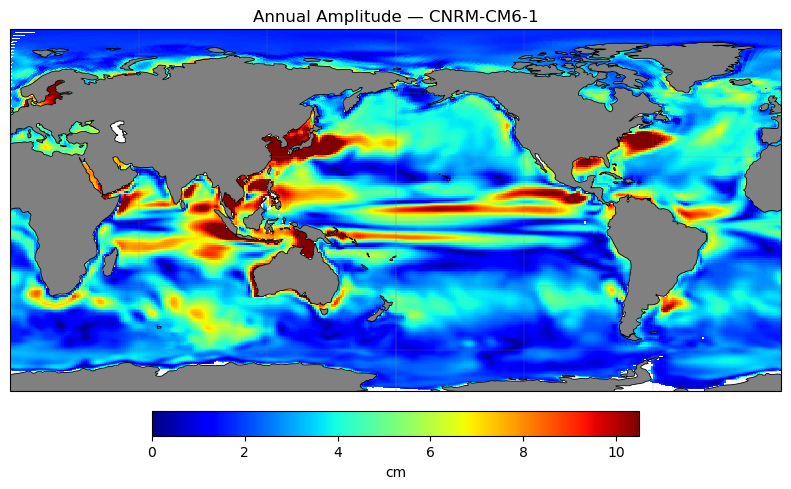

CNRM-CM6-1-HR


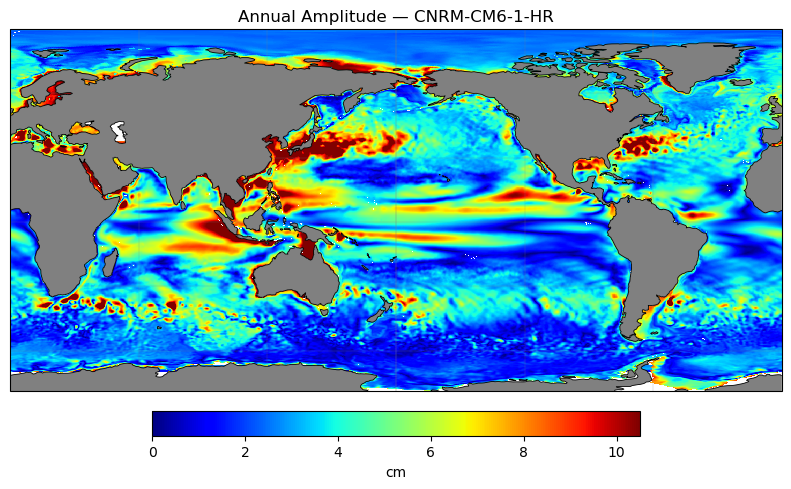

EC-Earth3P


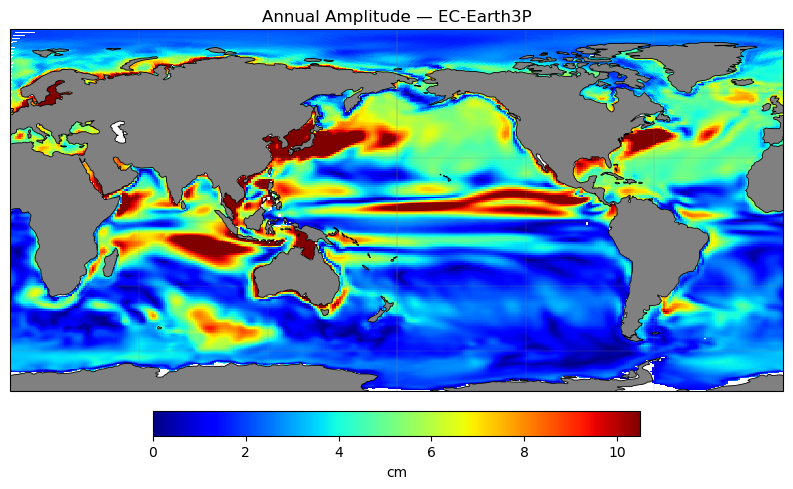

EC-Earth3P-HR


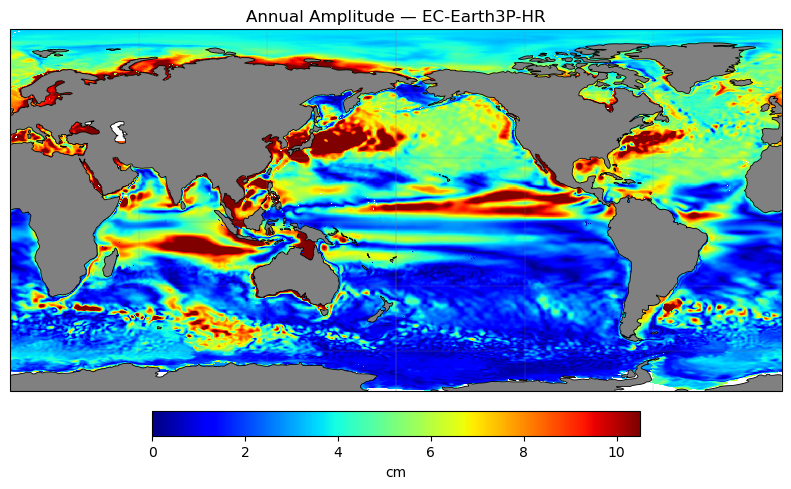

GFDL-ESM4


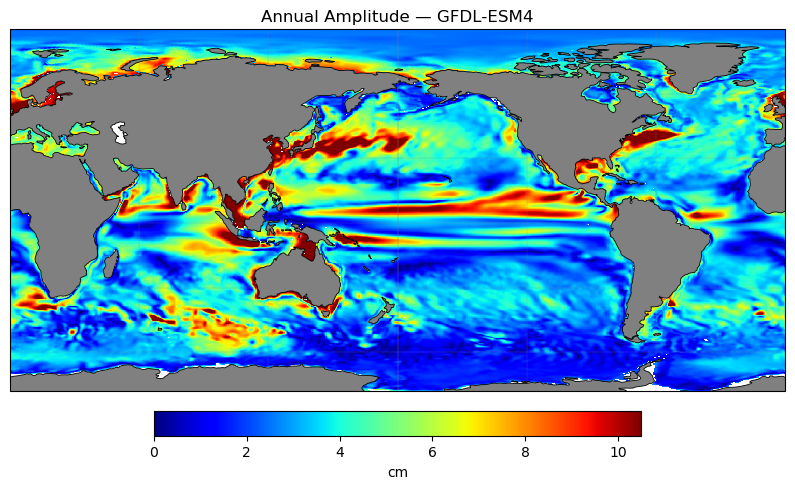

GFDL-CM4


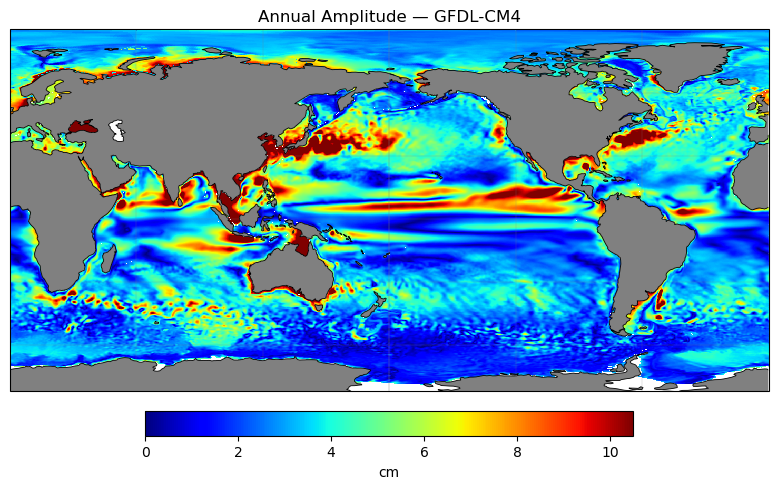

HadGEM3-GC31-LL


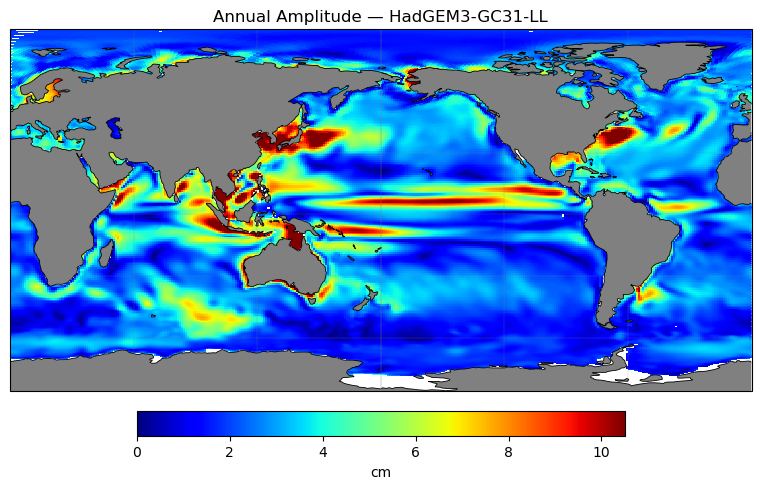

HadGEM3-GC31-MM


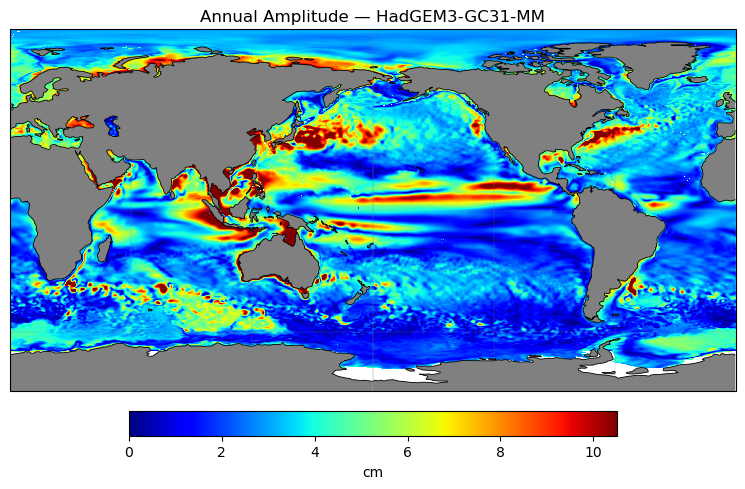

HadGEM3-GC31-HM


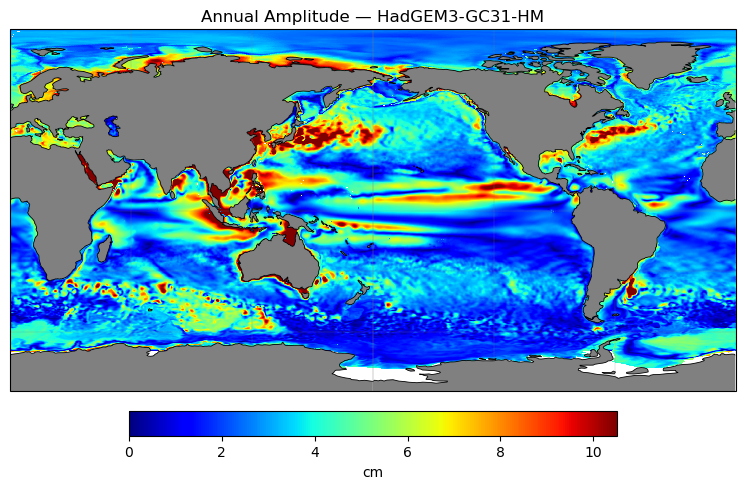

ECMWF-IFS-LR


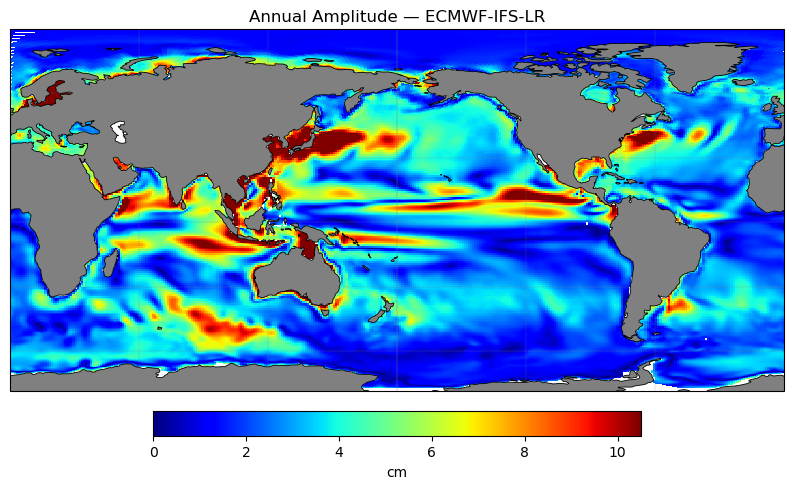

ECMWF-IFS-MR


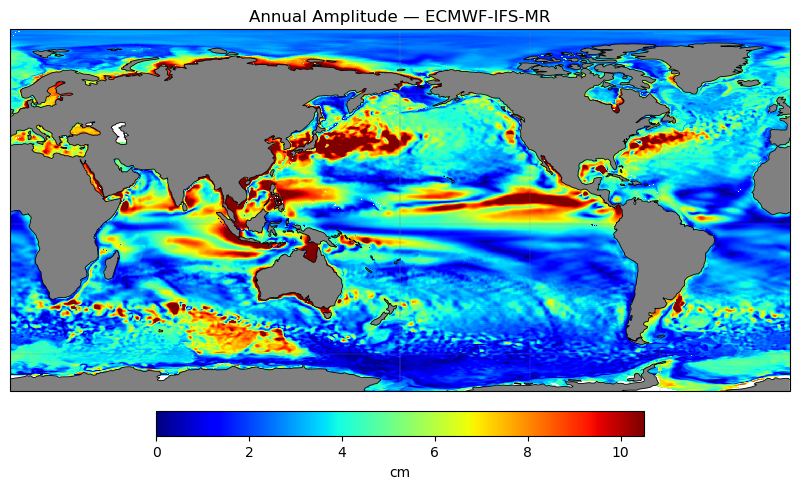

CPU times: user 4min 20s, sys: 3.75 s, total: 4min 24s
Wall time: 6min 8s


In [12]:
%%time
for i in range(len(source_ids)):
    print(source_ids[i])
    plot_amp_map(ha_outputs[i], 
                 var="A_sa", 
                 cmap="jet",
                 title = f"Annual Amplitude — {source_ids[i]}")

CNRM-CM6-1


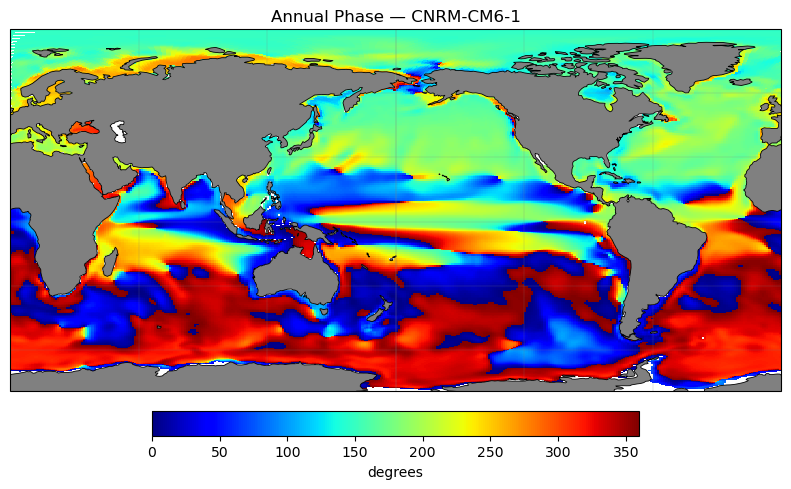

CNRM-CM6-1-HR


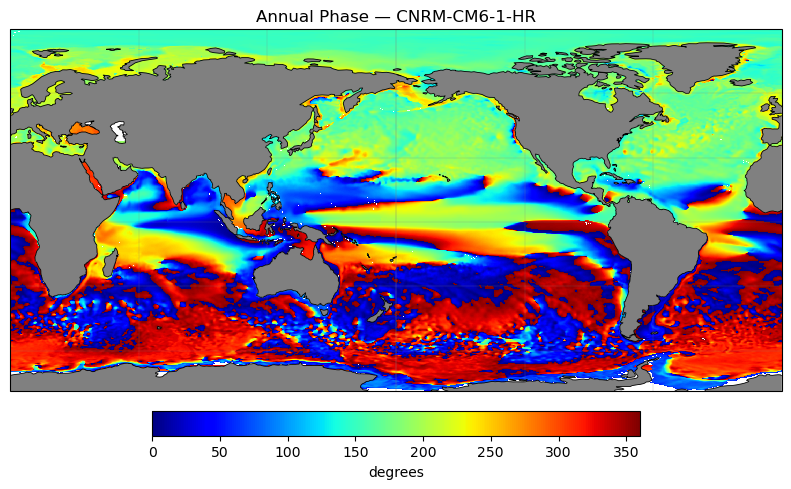

EC-Earth3P


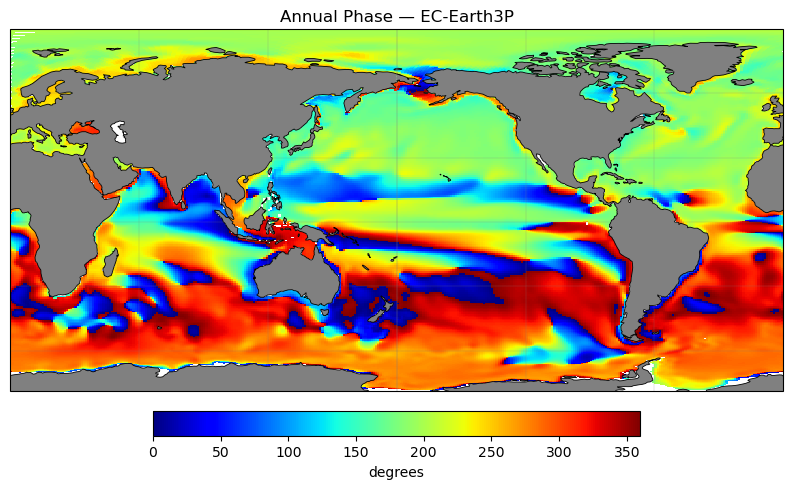

EC-Earth3P-HR


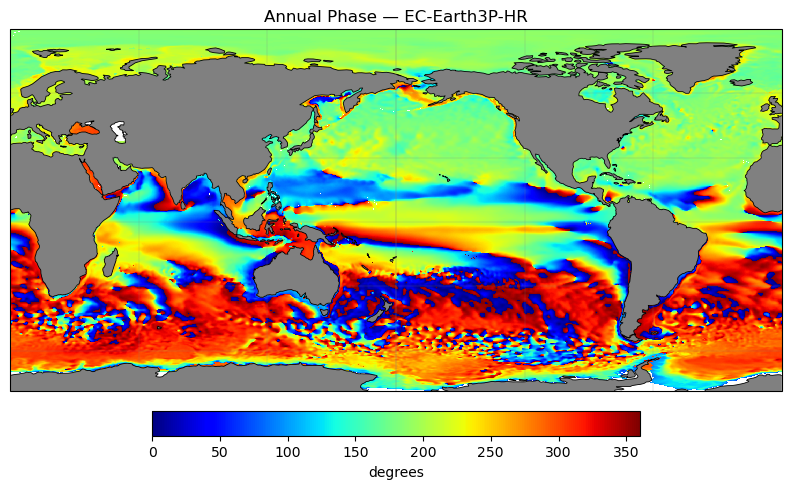

GFDL-ESM4


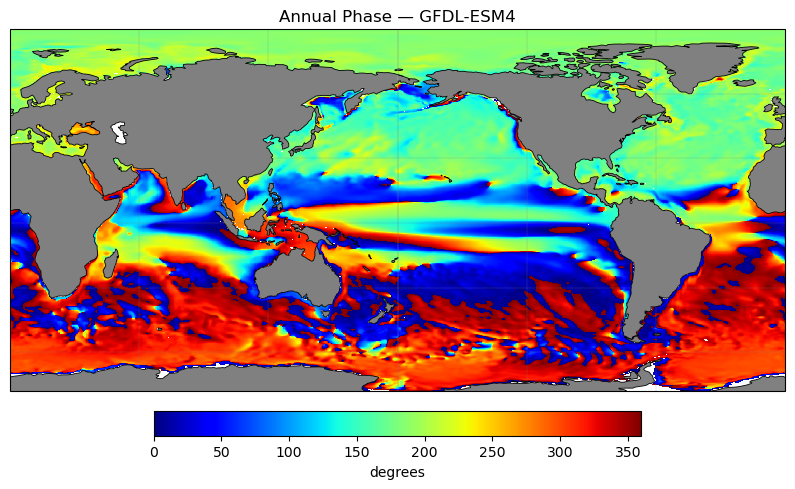

GFDL-CM4


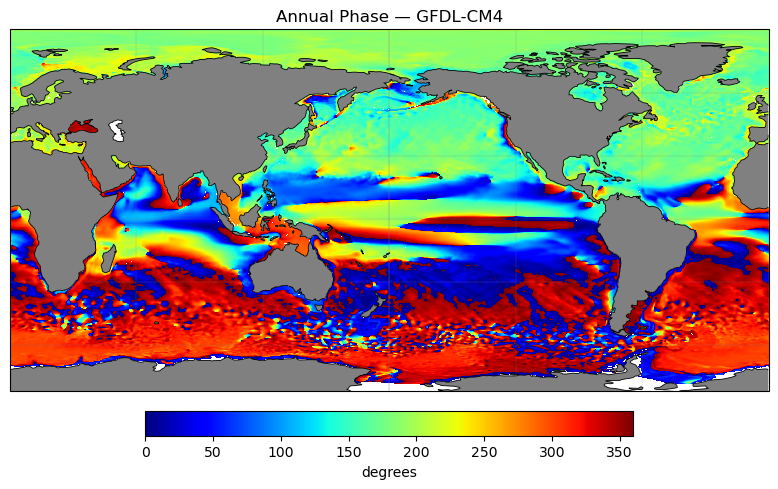

HadGEM3-GC31-LL


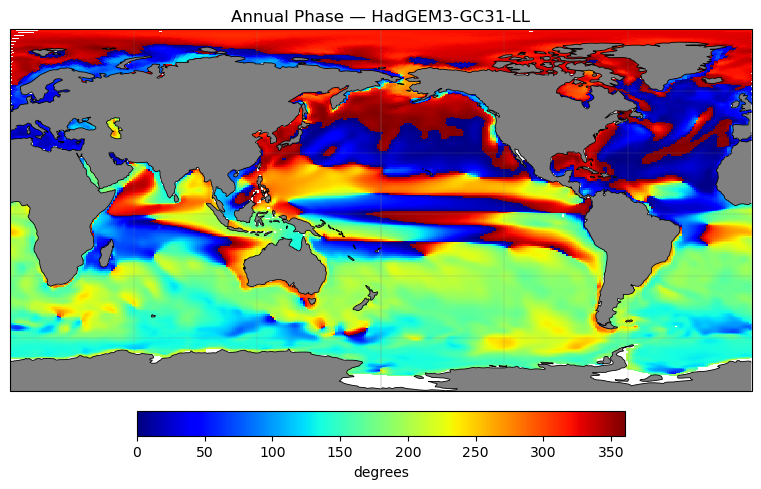

HadGEM3-GC31-MM


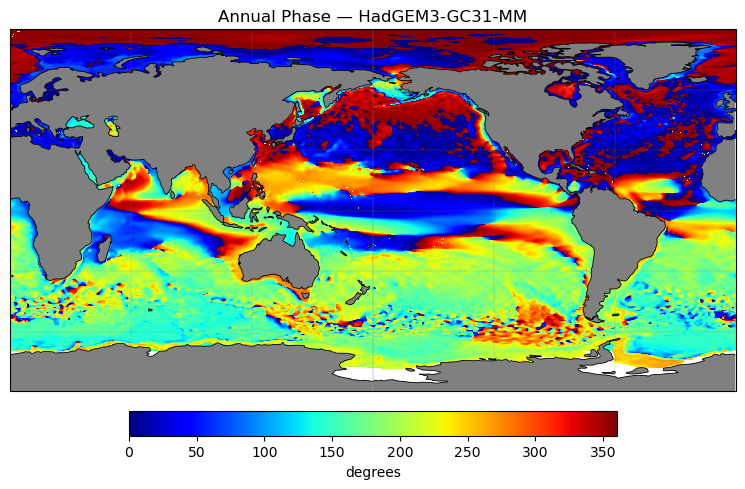

HadGEM3-GC31-HM


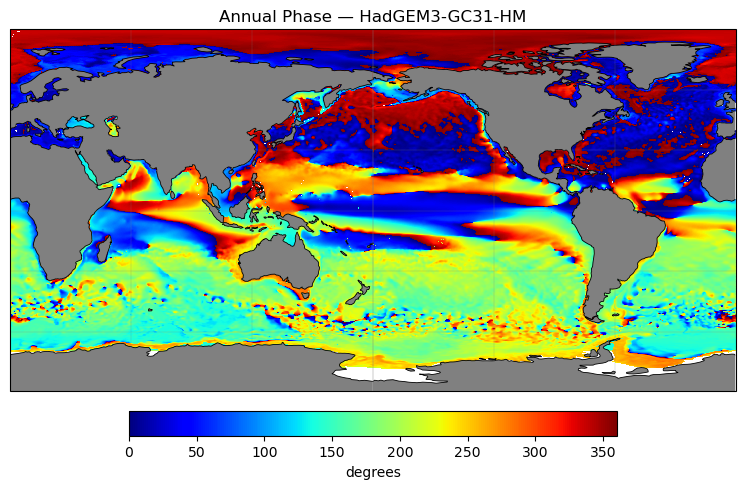

ECMWF-IFS-LR


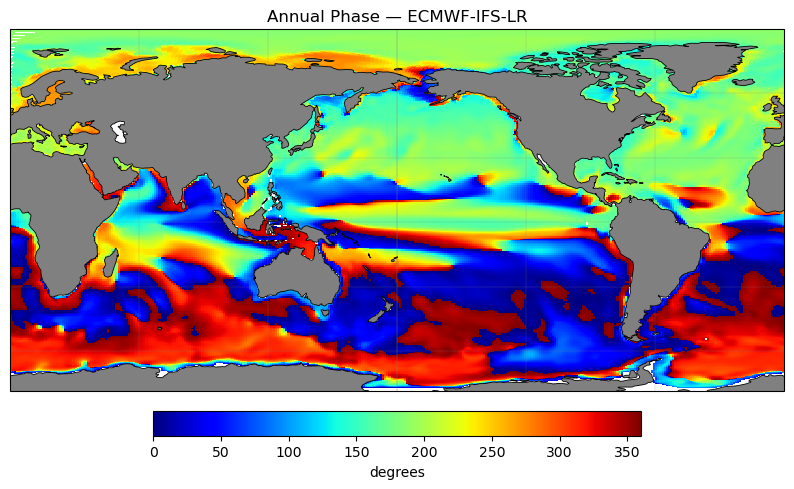

ECMWF-IFS-MR


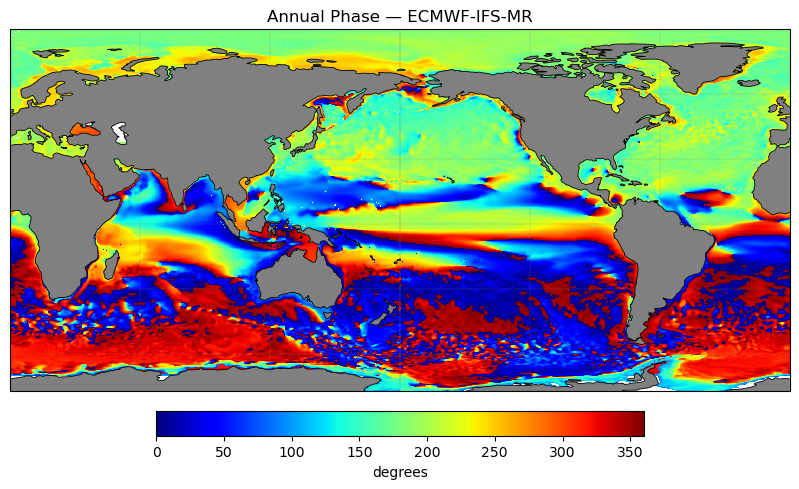

CPU times: user 4min 17s, sys: 3.22 s, total: 4min 20s
Wall time: 5min 51s


In [13]:
%%time
for i in range(len(source_ids)):
    print(source_ids[i])
    plot_phase_map(ha_outputs[i], 
                 var="phi_sa_deg", 
                 cmap="jet",
                 title = f"Annual Phase — {source_ids[i]}")

CNRM-CM6-1


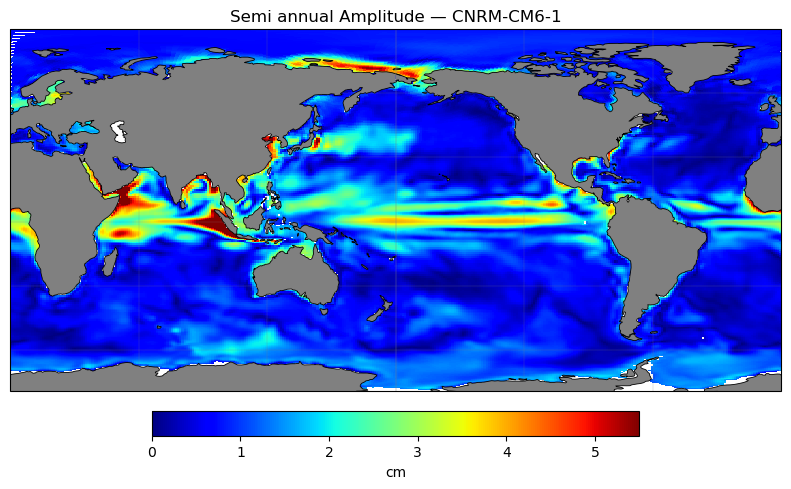

CNRM-CM6-1-HR


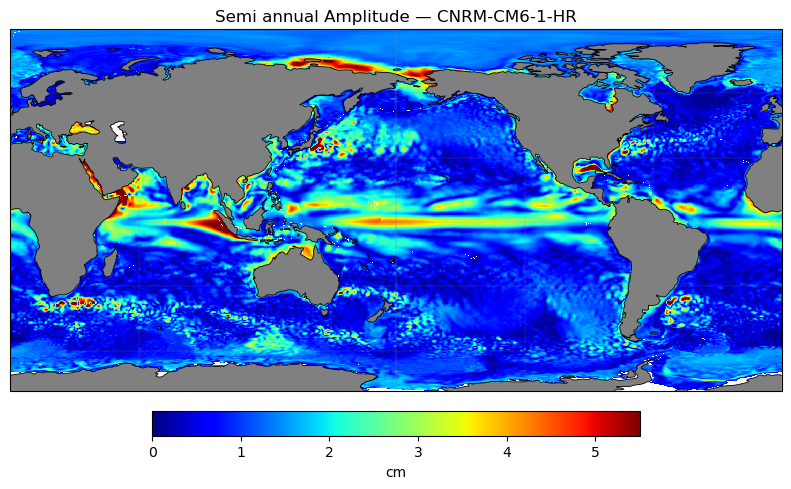

EC-Earth3P


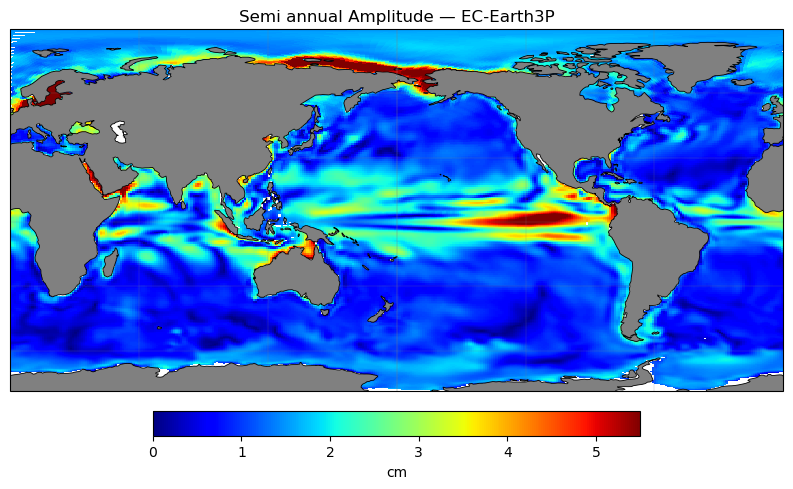

EC-Earth3P-HR


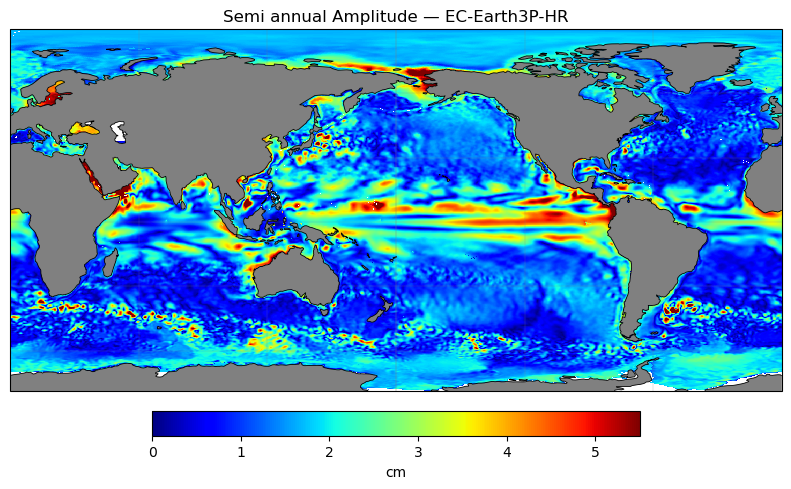

GFDL-ESM4


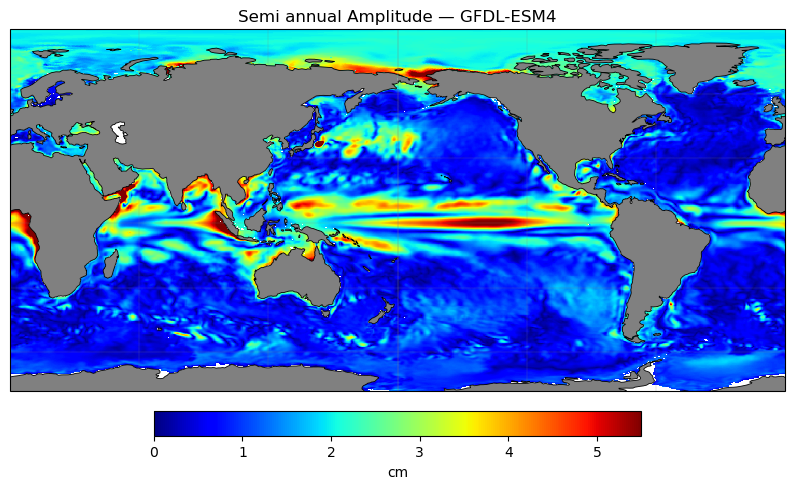

GFDL-CM4


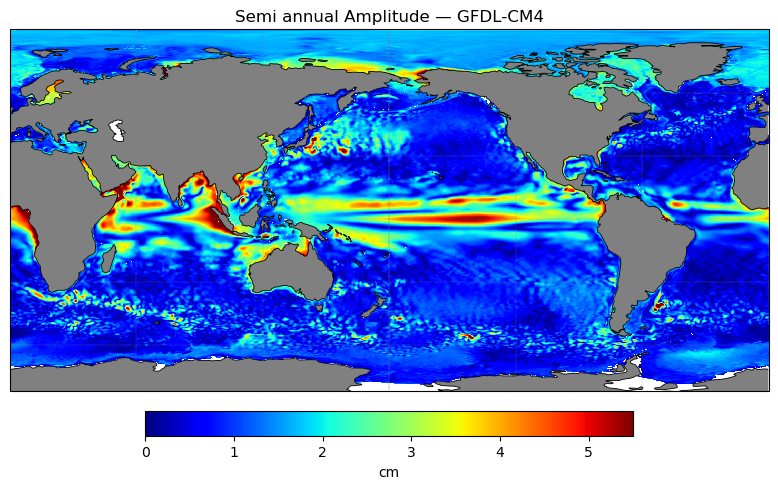

HadGEM3-GC31-LL


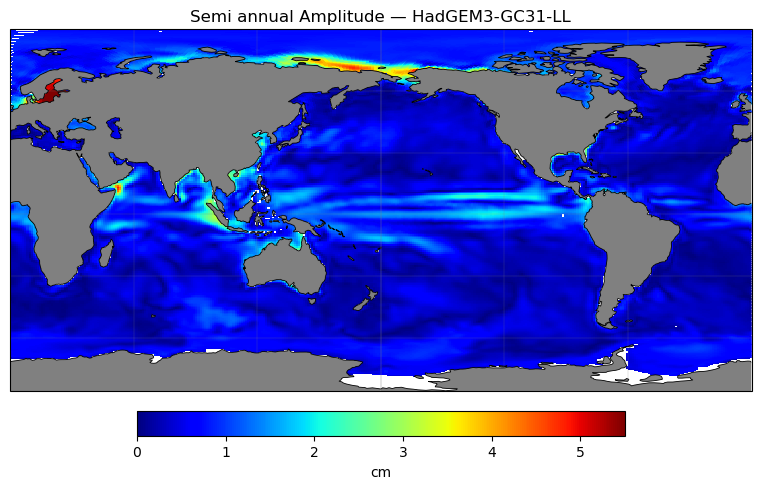

HadGEM3-GC31-MM


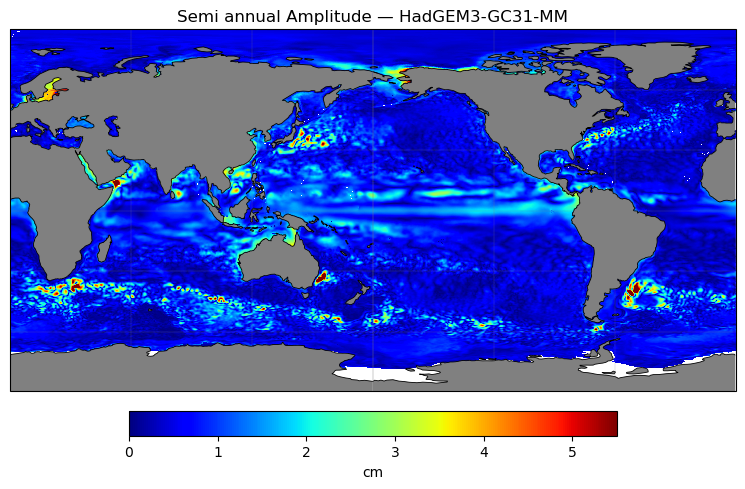

HadGEM3-GC31-HM


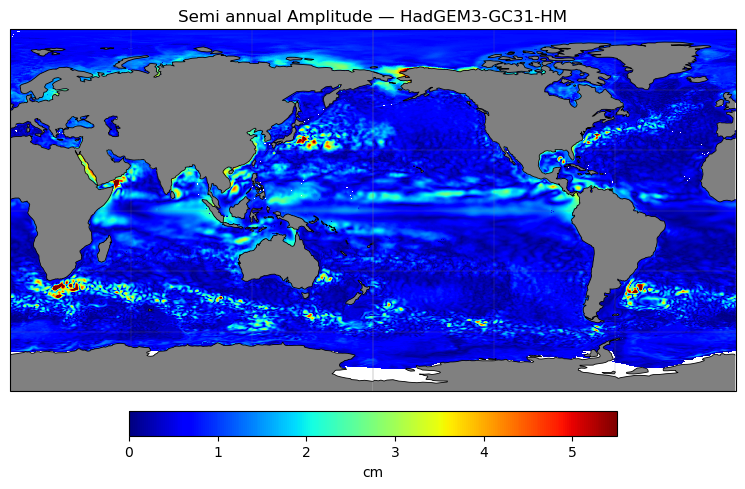

ECMWF-IFS-LR


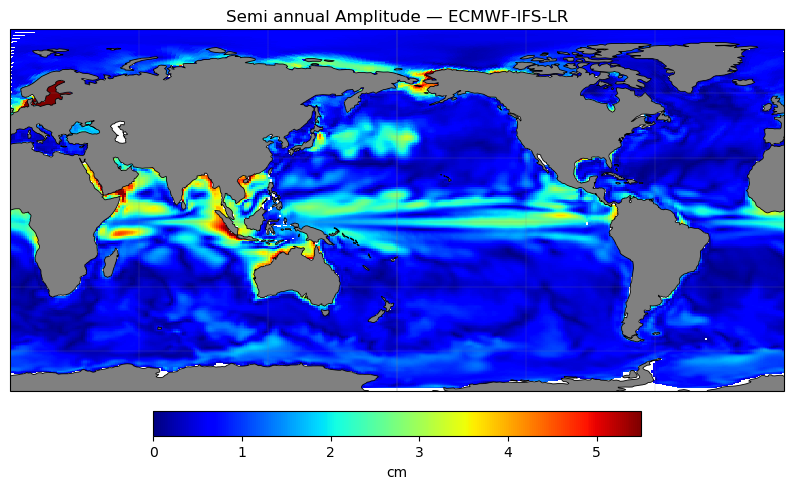

ECMWF-IFS-MR


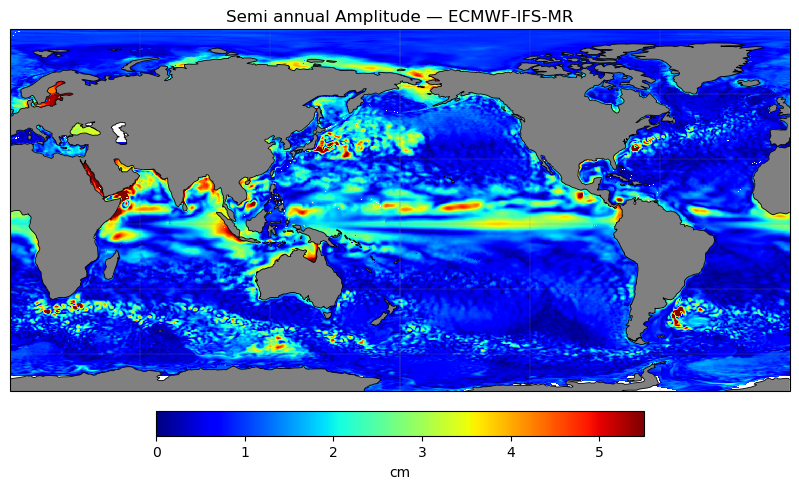

CPU times: user 4min 19s, sys: 3.22 s, total: 4min 22s
Wall time: 6min 4s


In [17]:
%%time
for i in range(len(source_ids)):
    print(source_ids[i])
    plot_amp_map(ha_outputs[i], 
                 var="A_ss", 
                 cmap="jet",
                 vmin=0, vmax=5.5,
                 title = f"Semi annual Amplitude — {source_ids[i]}")

CNRM-CM6-1


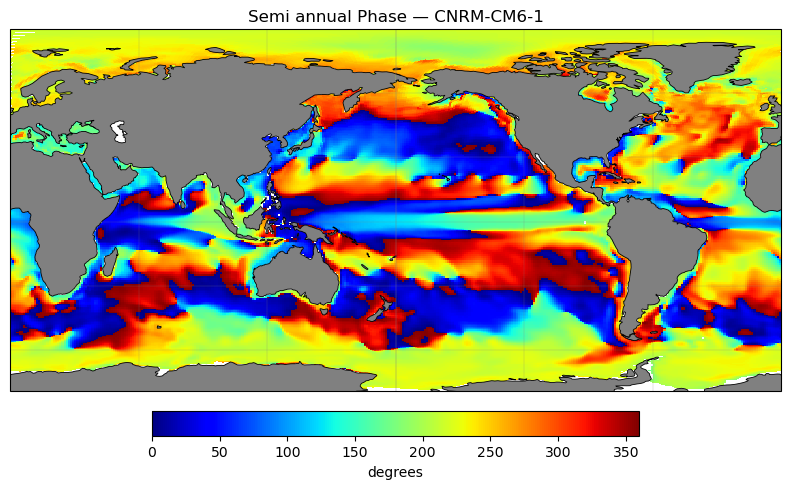

CNRM-CM6-1-HR


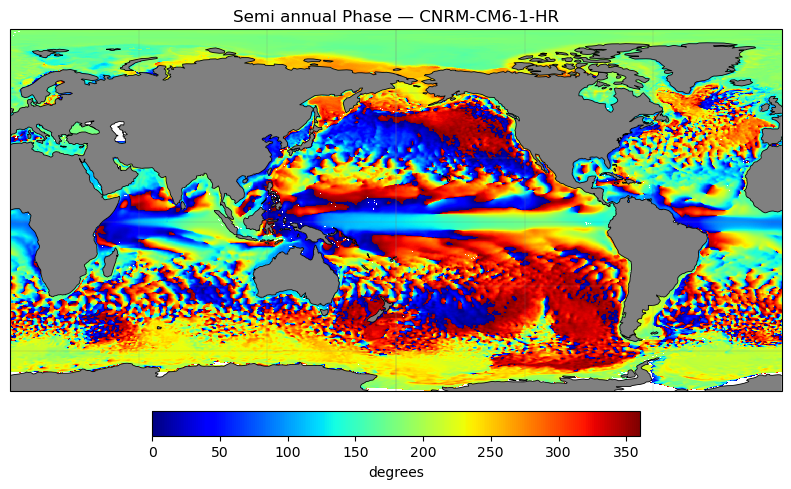

EC-Earth3P


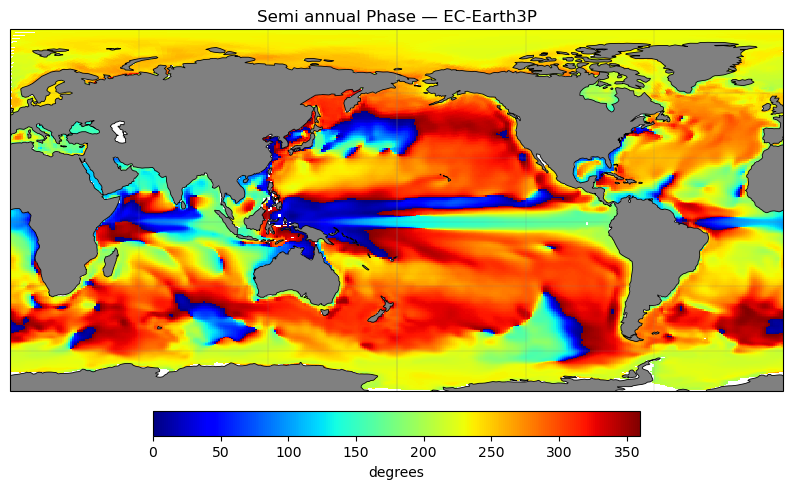

EC-Earth3P-HR


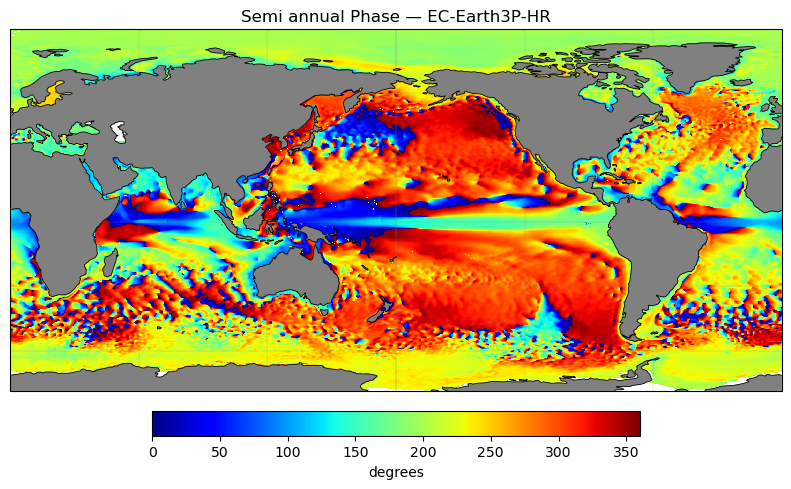

GFDL-ESM4


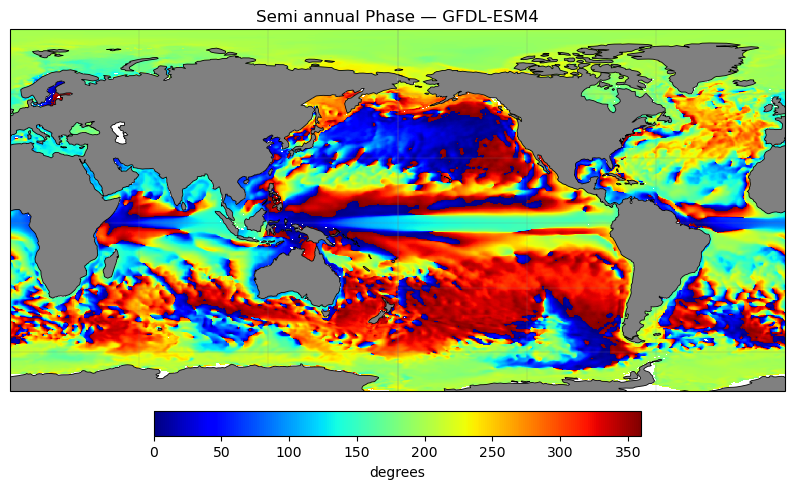

GFDL-CM4


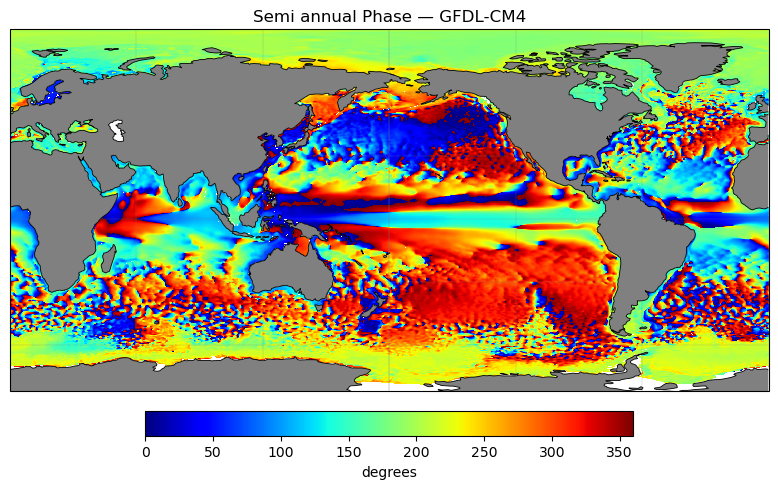

HadGEM3-GC31-LL


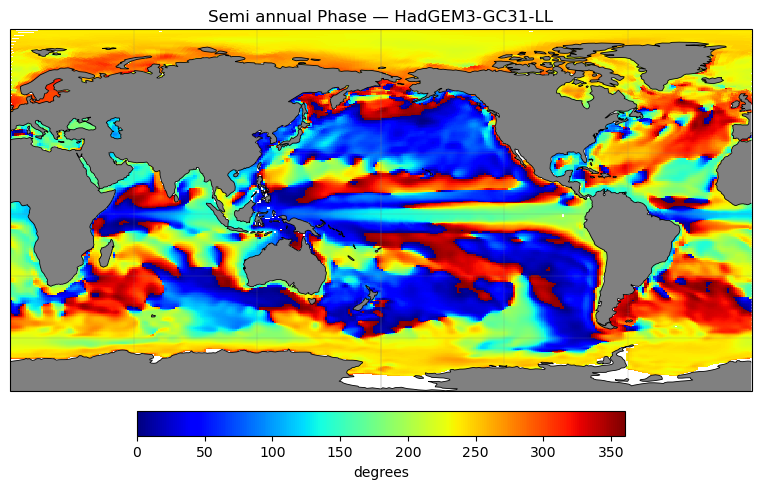

HadGEM3-GC31-MM


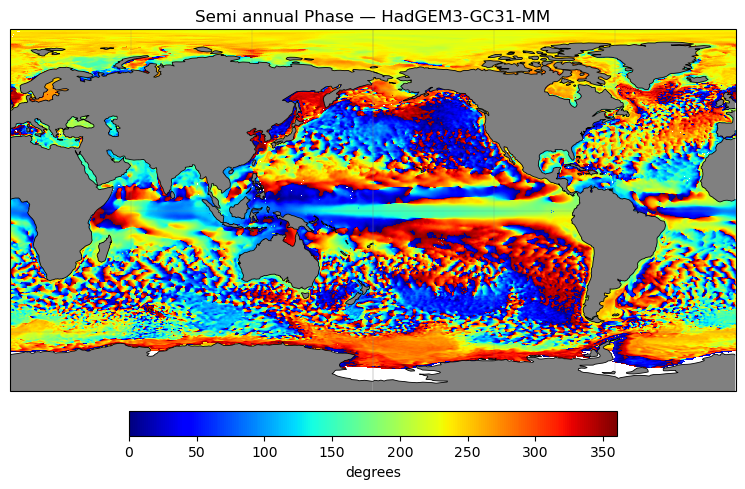

HadGEM3-GC31-HM


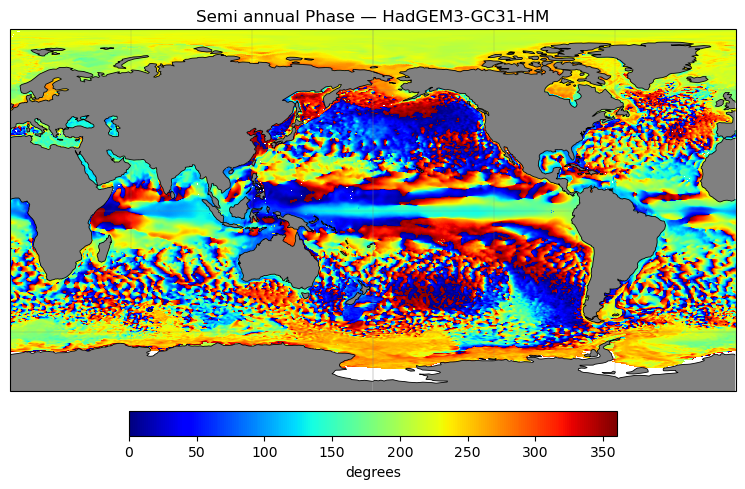

ECMWF-IFS-LR


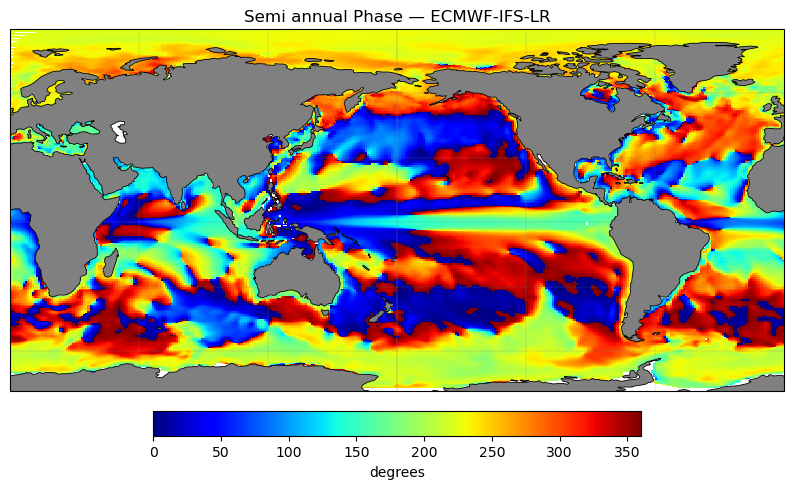

ECMWF-IFS-MR


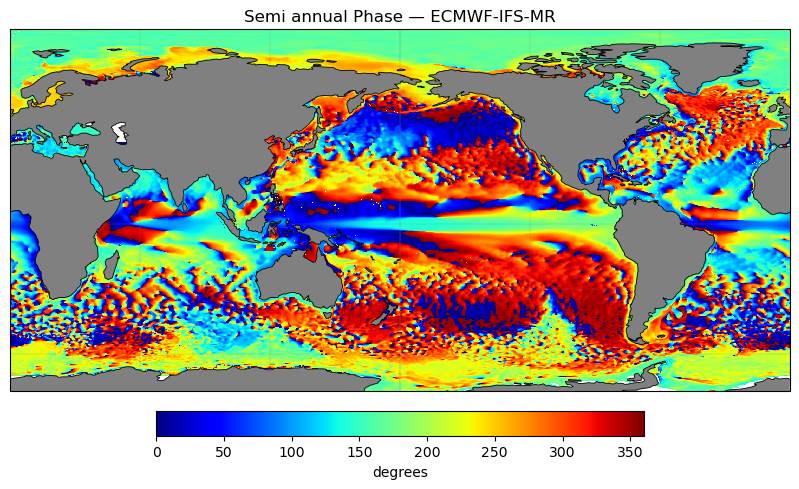

CPU times: user 4min 21s, sys: 3.18 s, total: 4min 24s
Wall time: 6min 13s


In [18]:
%%time
for i in range(len(source_ids)):
    print(source_ids[i])
    plot_phase_map(ha_outputs[i], 
                 var="phi_ss_deg", 
                 cmap="jet",
                 title = f"Semi annual Phase — {source_ids[i]}")

### Roughwork - No functional code beyond this point